In [1]:
# 1. Clona il repository
!git clone https://github.com/MisterCioffi/SteganoGAN.git

# 2. Entra nella cartella del progetto
%cd SteganoGAN

# 3. Rimuovi i limiti superiori stringenti dal file setup.py
with open('setup.py', 'r') as f:
    setup_content = f.read()

# Rimuoviamo i vincoli superiori che rompono Colab
setup_content = setup_content.replace('<2.5.0', '')
setup_content = setup_content.replace('<1.2.0', '')
setup_content = setup_content.replace('<1.16.0', '')
setup_content = setup_content.replace('<8.0.0', '')
setup_content = setup_content.replace('<2.0.0', '')

with open('setup.py', 'w') as f:
    f.write(setup_content)

print("setup.py patchato con successo!")

Cloning into 'SteganoGAN'...
remote: Enumerating objects: 1342, done.
remote: Counting objects: 100% (25/25), done.
remote: Compressing objects: 100% (6/6), done.
remote: Total 1342 (delta 20), reused 19 (delta 19), pack-reused 1317 (from 2)
Receiving objects: 100% (1342/1342), 94.60 MiB | 23.22 MiB/s, done.
Resolving deltas: 100% (561/561), done.
/content/SteganoGAN
setup.py patchato con successo!


In [2]:
# Installa le dipendenze e il pacchetto
!pip install -e .

Obtaining file:///content/SteganoGAN
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Created wheel for reedsolo: filename=reedsolo-0.3-py3-none-any.whl size=5301 sha256=3c44b7a2788aa5b00efa9a463e05a86458f9d200e7d2291b4424b20810e1d95f
  Stored in directory: /root/.cache/pip/wheels/5c/14/ad/f69c34ef121e2c2ef5ae1123d4efaec9f7e246ad734186ffa3
Successfully built reedsolo
  Running setup.py develop for steganogan


In [3]:
import os
import torch
import torch.optim
import torch.optim.adam
import steganogan.models
from steganogan import SteganoGAN
import numpy as np
import skimage.io as io

# --- 1. PATCH PER L'OTTIMIZZATORE ADAM (Livello 1 e 2) ---
_original_optimizer_setstate = torch.optim.Optimizer.__setstate__
def _safe_setstate(self, state):
    if isinstance(state, dict) and 'defaults' not in state:
        state['defaults'] = {}
    try:
        _original_optimizer_setstate(self, state)
    except Exception:
        pass
torch.optim.Optimizer.__setstate__ = _safe_setstate

# NOVITÀ: Patch specifica per Adam per l'errore param_groups
_original_adam_setstate = torch.optim.Adam.__setstate__
def _safe_adam_setstate(self, state):
    if not hasattr(self, 'param_groups'):
        self.param_groups = []  # Gli diamo una lista vuota per non farlo arrabbiare
    try:
        _original_adam_setstate(self, state)
    except Exception:
        pass
torch.optim.Adam.__setstate__ = _safe_adam_setstate


# --- 2. PATCH PER LA SICUREZZA DI PYTORCH 2.6+ ---
@classmethod
def custom_load(cls, architecture=None, path=None, cuda=True, verbose=False):
    if architecture and not path:
        model_name = '{}.steg'.format(architecture)
        pretrained_path = os.path.join(os.path.dirname(steganogan.models.__file__), 'pretrained')
        path = os.path.join(pretrained_path, model_name)
    elif (architecture is None and path is None) or (architecture and path):
        raise ValueError('Please provide either an architecture or a path to pretrained model.')

    # weights_only=False per bypassare il blocco di sicurezza
    steganogan_model = torch.load(path, map_location='cpu', weights_only=False)
    steganogan_model.verbose = verbose

    steganogan_model.encoder.upgrade_legacy()
    steganogan_model.decoder.upgrade_legacy()
    steganogan_model.critic.upgrade_legacy()

    steganogan_model.set_device(cuda)
    return steganogan_model

SteganoGAN.load = custom_load


# --- 3. IL TEST FINALE ---
print("Caricamento del modello (con Super Patch 2.0 attiva)...")
steganogan_model = SteganoGAN.load(architecture='dense')

# Ora proviamo finalmente il Logo!
cover_image_path = 'research/input.png'
stego_image_path = 'output.png'
messaggio_segreto = "prova"

print("\nNascondo il messaggio nel Logo...")
steganogan_model.encode(cover_image_path, stego_image_path, messaggio_segreto)
print(f"Immagine salvata in: {stego_image_path}")

x = np.float64(io.imread(cover_image_path))
z = np.float64(io.imread(stego_image_path))
MSE = np.mean((x-z)**2)

print("MSE: ", MSE)

print("\nEstraggo il messaggio dal Logo modificato...")
messaggio_decodificato = steganogan_model.decode(stego_image_path)

print("\n--- RISULTATO ---")
print(f"Messaggio estratto: {messaggio_decodificato}")

Caricamento del modello (con Super Patch 2.0 attiva)...


/usr/local/lib/python3.12/dist-packages/torch/serialization.py:1782: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  _check_container_source(*data)
/usr/local/lib/python3.12/dist-packages/torch/serialization.py:1782: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  _check_container_source(*data)
/usr/local/lib/python3.12/dist-packages/torch/serialization.py:1782: SourceChangeWarning: source code of class 'torch.nn.modules.activation.LeakyReLU' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.


Nascondo il messaggio nel Logo...
Immagine salvata in: output.png
MSE:  12.802459207062455

Estraggo il messaggio dal Logo modificato...

--- RISULTATO ---
Messaggio estratto: prova


In [ ]:
import os
import torch
import torch.optim
import torch.optim.adam
import steganogan.models
from steganogan import SteganoGAN
import numpy as np
import skimage.io as io
from PIL import Image
import random
import string

# --- 1. PATCH PER L'OTTIMIZZATORE ADAM (Livello 1 e 2) ---
_original_optimizer_setstate = torch.optim.Optimizer.__setstate__
def _safe_setstate(self, state):
    if isinstance(state, dict) and 'defaults' not in state:
        state['defaults'] = {}
    try:
        _original_optimizer_setstate(self, state)
    except Exception:
        pass
torch.optim.Optimizer.__setstate__ = _safe_setstate

_original_adam_setstate = torch.optim.Adam.__setstate__
def _safe_adam_setstate(self, state):
    if not hasattr(self, 'param_groups'):
        self.param_groups = []
    try:
        _original_adam_setstate(self, state)
    except Exception:
        pass
torch.optim.Adam.__setstate__ = _safe_adam_setstate


# --- 2. PATCH PER LA SICUREZZA DI PYTORCH 2.6+ ---
@classmethod
def custom_load(cls, architecture=None, path=None, cuda=True, verbose=False):
    if architecture and not path:
        model_name = '{}.steg'.format(architecture)
        pretrained_path = os.path.join(os.path.dirname(steganogan.models.__file__), 'pretrained')
        path = os.path.join(pretrained_path, model_name)
    elif (architecture is None and path is None) or (architecture and path):
        raise ValueError('Please provide either an architecture or a path to pretrained model.')

    # weights_only=False per bypassare il blocco di sicurezza
    steganogan_model = torch.load(path, map_location='cpu', weights_only=False)
    steganogan_model.verbose = verbose

    steganogan_model.encoder.upgrade_legacy()
    steganogan_model.decoder.upgrade_legacy()
    steganogan_model.critic.upgrade_legacy()

    steganogan_model.set_device(cuda)
    return steganogan_model

SteganoGAN.load = custom_load


# --- 3. IL TEST FINALE CON PESI CUSTOM E PAYLOAD A 4.4 BPP ---

# ATTENZIONE: Assicurati che il file 'dense_6_coco.steg' sia nella stessa cartella
# dello script, altrimenti inserisci il percorso completo.
percorso_modello_custom = 'steganogan/pretrained/dense_6_coco.steg'

print(f"Caricamento del modello custom da: {percorso_modello_custom} ...")
# Utilizziamo 'path' invece di 'architecture'
steganogan_model = SteganoGAN.load(path=percorso_modello_custom)

cover_image_path = 'research/input.png'
stego_image_path = 'output.png'

# --- 4. CALCOLO DEL PAYLOAD PER GARANTIRE 4.4 BPP ---
# Apriamo l'immagine per leggerne le dimensioni
img_cover = Image.open(cover_image_path)
width, height = img_cover.size
pixel_totali = width * height

target_bpp = 1.0
bit_necessari = target_bpp * pixel_totali
caratteri_necessari = int(bit_necessari / 8) # 1 carattere ASCII = 8 bit

print(f"\n--- Analisi Immagine e Payload ---")
print(f"Dimensioni: {width}x{height} pixel (Totale: {pixel_totali} pixel)")
print(f"Target BPP: {target_bpp}")
print(f"Generazione automatica di una stringa lunga {caratteri_necessari} caratteri...")

# Generiamo una stringa casuale esatta per riempire i 4.4 bpp
messaggio_segreto = ''.join(random.choices(string.ascii_letters + string.digits, k=caratteri_necessari))

print("\nNascondo il messaggio nel Logo...")
# Inseriamo il payload appena generato
steganogan_model.encode(cover_image_path, stego_image_path, messaggio_segreto)
print(f"Immagine salvata in: {stego_image_path}")

# --- 5. CALCOLO MSE ---
x = np.float64(io.imread(cover_image_path))
z = np.float64(io.imread(stego_image_path))
MSE = np.mean((x-z)**2)

print("\nMSE: ", MSE)

print("\nEstraggo il messaggio dall'immagine modificata...")
messaggio_decodificato = steganogan_model.decode(stego_image_path)

print("\n--- VERIFICA ESTRAZIONE ---")
# Controlliamo se la lunghezza e il testo coincidono
if messaggio_segreto == messaggio_decodificato:
    print(f"SUCCESSO! Estrazione perfetta. L'immagine trasporta fedelmente {target_bpp} bpp.")
else:
    print("ERRORE: Il messaggio estratto non coincide con l'originale.")
    print(f"Lunghezza originale: {len(messaggio_segreto)} | Lunghezza estratta: {len(messaggio_decodificato)}")

Caricamento del modello custom da: steganogan/pretrained/dense_6_coco.steg ...

--- Analisi Immagine e Payload ---
Dimensioni: 2040x1152 pixel (Totale: 2350080 pixel)
Target BPP: 1.0
Generazione automatica di una stringa lunga 293760 caratteri...

Nascondo il messaggio nel Logo...


/usr/local/lib/python3.12/dist-packages/torch/serialization.py:1782: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  _check_container_source(*data)
/usr/local/lib/python3.12/dist-packages/torch/serialization.py:1782: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  _check_container_source(*data)
/usr/local/lib/python3.12/dist-packages/torch/serialization.py:1782: SourceChangeWarning: source code of class 'torch.nn.modules.activation.LeakyReLU' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.

KeyboardInterrupt: 

In [ ]:
import torchvision.transforms as transforms
from PIL import Image

def interroga_il_critic(percorso_immagine, modello):
    """
    Legge un'immagine e chiede al Critic di valutarla.
    Restituisce un numero: > 0 (Tende al Reale), < 0 (Tende al Falso/Modificato)
    """
    # 1. Carica l'immagine a colori
    img = Image.open(percorso_immagine).convert('RGB')

    # 2. Trasforma l'immagine in Tensore e normalizza i pixel tra 0 e 1
    trasformazione = transforms.ToTensor()
    img_tensor = trasformazione(img).unsqueeze(0) # unsqueeze aggiunge la dimensione 'Batch' (1, 3, H, W)

    # 3. Sposta i dati sulla CPU o GPU (in base a dove sta girando il modello)
    img_tensor = img_tensor.to(modello.device)

    # 4. Chiedi il parere al Critic senza allenarlo (no_grad)
    with torch.no_grad():
        score_tensor = modello.critic(img_tensor)

    # 5. Fai la media per ottenere il voto finale (torch.mean)
    voto_finale = score_tensor.mean().item()
    return voto_finale

In [ ]:
stego_image_path_input = 'research/input_512.png'
wasse_in = interroga_il_critic(stego_image_path_input, steganogan_model)
print("input:",wasse_in)

stego_image_path_output = 'output.png'
wasse_out = interroga_il_critic(stego_image_path_output, steganogan_model)
print("output:",wasse_out)


wasse_loss = wasse_out - wasse_in
print(wasse_loss)

input: -0.03899036720395088
output: -0.03997257724404335
-0.0009822100400924683


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

def crea_mappa_rumore(path_originale, path_stego, amplificazione=30):
    """
    Calcola la differenza tra l'immagine originale e quella modificata,
    e la mostra come una mappa di calore (Heatmap).
    Richiede che le immagini abbiano la stessa identica dimensione per evitare artefatti.
    """
    print(f"Generazione Mappa di Calore per: {path_originale} vs {path_stego}")

    # 1. Carica le immagini con PIL
    img_orig_pil = Image.open(path_originale).convert('RGB')
    img_stego_pil = Image.open(path_stego).convert('RGB')

    # --- NUOVO CONTROLLO DI SICUREZZA ---
    # Ci assicuriamo che le dimensioni siano identiche. Niente più ridimensionamenti automatici!
    if img_orig_pil.size != img_stego_pil.size:
        raise ValueError(
            f"ERRORE: Le dimensioni non combaciano! Originale {img_orig_pil.size} vs Stego {img_stego_pil.size}.\n"
            f"Per una mappa termica pura, devi prima ritagliare l'immagine originale "
            f"usando l'altro script, in modo che SteganoGAN non ne alteri la risoluzione."
        )

    # 2. Converti in matrici NumPy per fare i calcoli
    img_orig = np.array(img_orig_pil, dtype=np.float32)
    img_stego = np.array(img_stego_pil, dtype=np.float32)

    # 3. Calcola la differenza assoluta pixel per pixel
    differenza = np.abs(img_orig - img_stego)

    # 4. Fai la media sui 3 canali (Rosso, Verde, Blu) per avere un'unica scala di grigi
    mappa_2d = np.mean(differenza, axis=2)

    # 5. Moltiplica per rendere visibile il rumore all'occhio umano
    mappa_amplificata = np.clip(mappa_2d * amplificazione, 0, 255)

    # 6. Disegna il grafico
    plt.figure(figsize=(10, 8))
    plt.title(f"Mappa del Rumore (Amplificata {amplificazione}x)")
    plt.imshow(mappa_amplificata, cmap='hot')
    plt.colorbar(label="Intensità del Rumore Steganografico")
    plt.axis('off')
    plt.show()

  # Assicurati che i dati siano nel formato corretto (0-255)
    dati_uint8 = mappa_amplificata.astype(np.uint8)

    # Crea l'immagine e salvala
    img = Image.fromarray(dati_uint8)
    img.save('mappa_risultato.png')

# --- ESECUZIONE DEL TEST PULITO ---
# Ricorda di usare il file generato dallo script di ritaglio (es. 'input_512.png')
# crea_mappa_rumore('input_512.png', 'output_512.png')

Generazione Mappa di Calore per: research/input_512.png vs output.png


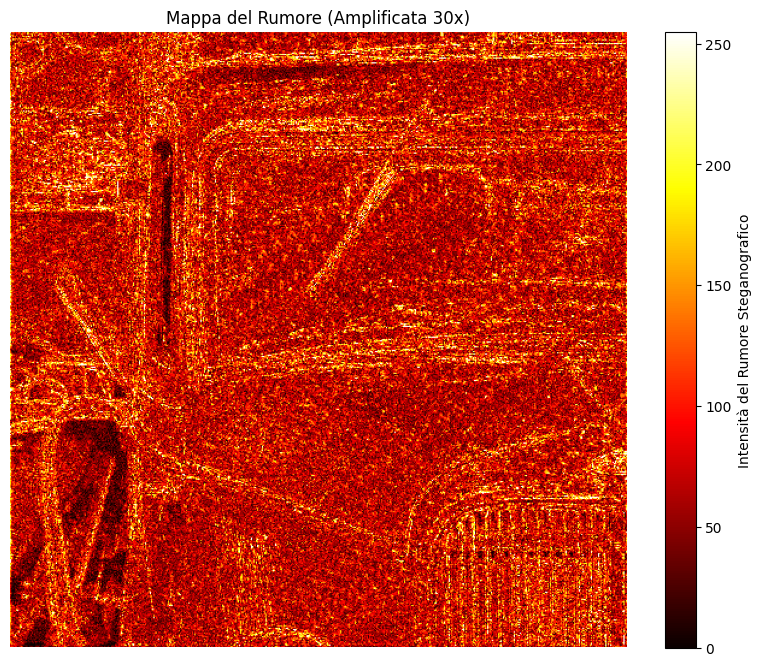

In [ ]:
crea_mappa_rumore('research/input_512.png', 'output.png')
#crea_mappa_rumore('research/balls.png', 'output_b.png')
#crea_mappa_rumore('research/cyberpunk.png', 'output_c.png')

In [ ]:
import os
import urllib.request
import zipfile
import numpy as np
import skimage.io as io
from PIL import Image
import random
import string
import pandas as pd

# ==========================================================
# 1. FUNZIONI DI SUPPORTO (DOWNLOAD E CALCOLO PAYLOAD)
# ==========================================================

def prepara_dataset_coco(cartella_destinazione, num_immagini=100):
    """Scarica e prepara le immagini reali da MS COCO in formato PNG 512x512."""
    os.makedirs(cartella_destinazione, exist_ok=True)
    if len([f for f in os.listdir(cartella_destinazione) if f.endswith('.png')]) >= num_immagini:
        print(f"Dataset reale già pronto in '{cartella_destinazione}'.\n")
        return

    url_dataset = "http://images.cocodataset.org/zips/val2017.zip"
    file_zip = "val2017.zip"

    if not os.path.exists(file_zip):
        print("Download di MS COCO in corso (circa 1GB, attendere)...")
        urllib.request.urlretrieve(url_dataset, file_zip)

    print(f"Estrazione e conversione di {num_immagini} immagini in PNG...")
    immagini_salvate = 0
    with zipfile.ZipFile(file_zip, 'r') as zip_ref:
        for file_name in [f for f in zip_ref.namelist() if f.endswith('.jpg')]:
            if immagini_salvate >= num_immagini: break
            with zip_ref.open(file_name) as file:
                img = Image.open(file).convert('RGB').resize((512, 512), Image.LANCZOS)
                nome_base = os.path.splitext(os.path.basename(file_name))[0]
                img.save(os.path.join(cartella_destinazione, f"{nome_base}.png"), "PNG")
                immagini_salvate += 1
    print("Dataset pronto!\n")

def genera_payload_per_bpp(bpp, width=512, height=512):
    """Calcola i caratteri necessari per raggiungere il target bpp e genera una stringa."""
    pixel_totali = width * height
    bit_necessari = bpp * pixel_totali
    caratteri_necessari = int(bit_necessari / 8) # 1 carattere = 8 bit
    return ''.join(random.choices(string.ascii_letters + string.digits, k=caratteri_necessari))

# ==========================================================
# 2. FUNZIONE PRINCIPALE: ANALISI MULTI-PAYLOAD
# ==========================================================

def analisi_steganalisi_paper(cartella_input, cartella_output, modello, payloads_bpp=[0.1, 0.2, 0.3, 0.4, 0.5]):
    """Esegue l'analisi per MSE e Accuracy replicando la struttura a step di payload (0.1 - 0.5 bpp)."""
    os.makedirs(cartella_output, exist_ok=True)
    immagini = [f for f in os.listdir(cartella_input) if f.endswith('.png')]
    totale = len(immagini)

    if totale == 0:
        print("Nessuna immagine trovata.")
        return

    print(f"Inizio analisi su {totale} immagini. Range bpp: {payloads_bpp}")
    risultati = []

    for bpp in payloads_bpp:
        print(f"-> Analisi in corso per {bpp} bpp...")
        payload = genera_payload_per_bpp(bpp)
        mse_list = []
        estrazioni_corrette = 0

        for filename in immagini:
            cover_path = os.path.join(cartella_input, filename)
            stego_path = os.path.join(cartella_output, f"stego_{bpp}_{filename}")

            # 1. Iniezione
            modello.encode(cover_path, stego_path, payload)

            # 2. Calcolo MSE (Fidelity)
            img_cover = np.float64(io.imread(cover_path))
            img_stego = np.float64(io.imread(stego_path))
            mse = np.mean((img_cover - img_stego)**2)
            mse_list.append(mse)

            # 3. Verifica Accuracy
            try:
                msg_estratto = modello.decode(stego_path)
                if msg_estratto == payload:
                    estrazioni_corrette += 1
            except:
                pass # Se la decodifica fallisce, non incrementa le estrazioni corrette

        # Registra i risultati per la tabella
        risultati.append({
            "Payload (bpp)": bpp,
            "Lunghezza Testo (chars)": len(payload),
            "MSE Medio": round(np.mean(mse_list), 4),
            "Accuracy (%)": round((estrazioni_corrette / totale) * 100, 2)
        })

    # Stampa i risultati formattati come una tabella accademica
    df_risultati = pd.DataFrame(risultati)
    print("\n" + "="*60)
    print(" TABELLA DEI RISULTATI (Basata sulla metrica del Paper)")
    print("="*60)
    print(df_risultati.to_string(index=False))
    print("="*60 + "\n")
    return df_risultati

# ==========================================================
# 3. ESECUZIONE
# ==========================================================
cartella_dataset = 'dataset_reale_coco'
cartella_risultati = 'output_reale_coco'

# Prepara 100 immagini reali (puoi aumentare il numero se vuoi un test più lungo)
prepara_dataset_coco(cartella_dataset, num_immagini=100)

# Esegui l'analisi usando il tuo modello SteganoGAN
# Assicurati che 'steganogan_model' sia già caricato nel notebook
tabella_finale = analisi_steganalisi_paper(cartella_dataset, cartella_risultati, steganogan_model)

Download di MS COCO in corso (circa 1GB, attendere)...
Estrazione e conversione di 100 immagini in PNG...
Dataset pronto!

Inizio analisi su 100 immagini. Range bpp: [0.1, 0.2, 0.3, 0.4, 0.5]
-> Analisi in corso per 0.1 bpp...


---

---



MAPPA DEL RUMORE PER 20 IMMAGINI

Download immagini cover...


100%|██████████| 60/60 [00:32<00:00,  1.87it/s]


Pronte 60 immagini cover in 'cover_images/'
Modello caricato: <class 'steganogan.models.SteganoGAN'>
Encoding messaggi...


100%|██████████| 60/60 [00:29<00:00,  2.00it/s]


Coppie valide: 60
Calcolo residui e FFT...


60it [00:03, 16.96it/s]


Elaborati: 60 residui, shape: (60, 512, 512)


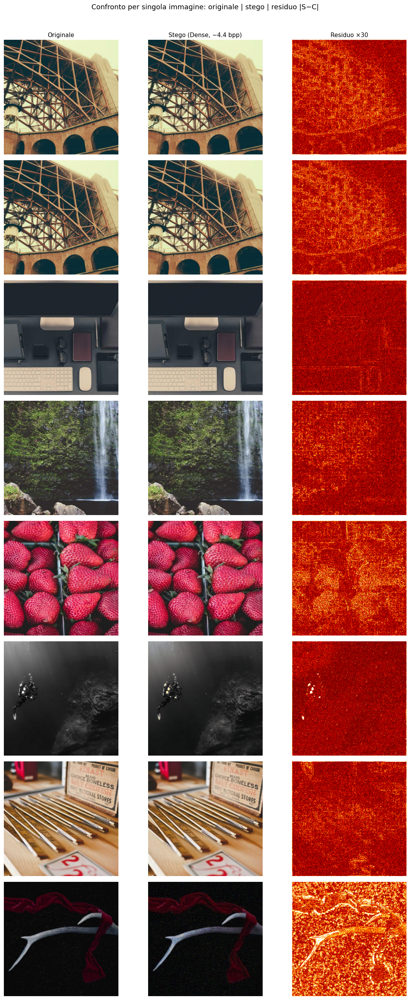

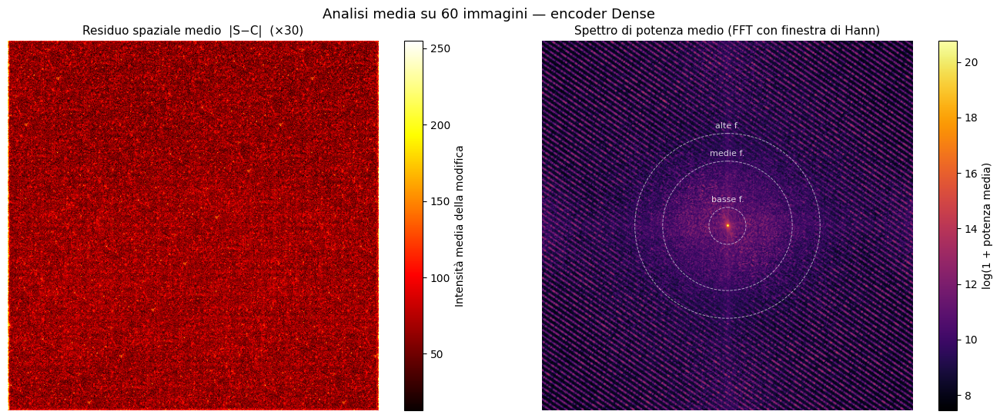

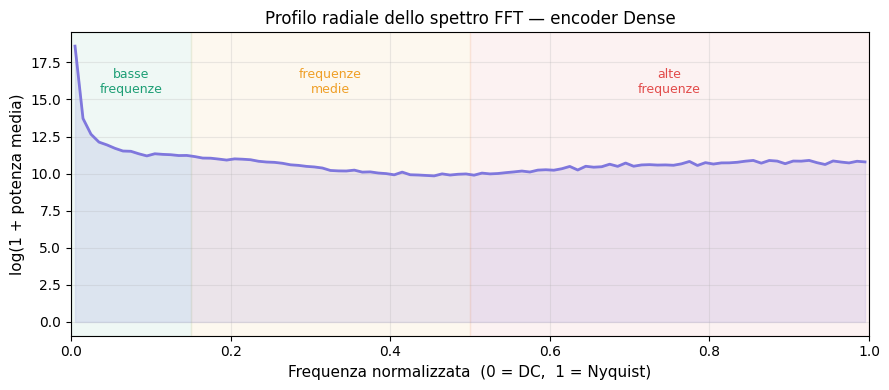

Distribuzione energia (escluso DC sotto 0.02):
  Basse frequenze  (0.02–0.15): 60.8%
  Frequenze medie  (0.15–0.50): 18.7%
  Alte frequenze   (0.50–1.00): 20.4%

→ Energia concentrata nelle BASSE frequenze


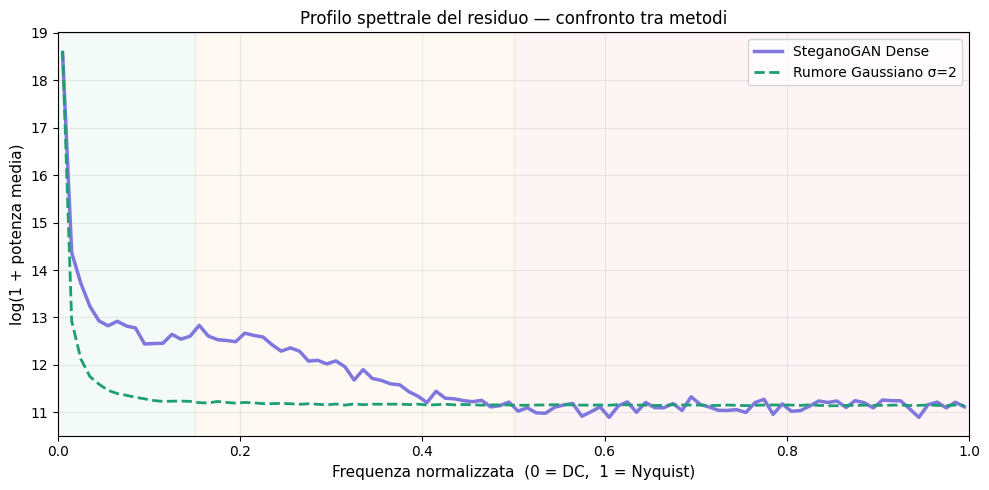


SteganoGAN Dense
  Basse  (0.02–0.15): 62.3%
  Medie  (0.15–0.50): 26.8%
  Alte   (0.50–1.00): 10.9%

Rumore Gaussiano σ=2
  Basse  (0.02–0.15): 40.2%
  Medie  (0.15–0.50): 30.3%
  Alte   (0.50–1.00): 29.5%


(np.float64(0.40188820166967),
 np.float64(0.30272608815754737),
 np.float64(0.2953857101727826))

In [ ]:
# ============================================================
# CELLA 1 — Installazioni e import
# ============================================================
!pip install steganogan requests Pillow numpy matplotlib tqdm --quiet

import os
import time
import requests
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from PIL import Image
from io import BytesIO
from tqdm import tqdm
from steganogan import SteganoGAN

N_IMMAGINI      = 60
IMG_SIZE        = 512          # SteganoGAN lavora bene con immagini quadrate
MESSAGGIO       = "steganogan frequency analysis secret payload test"
AMPLIFICAZIONE  = 30

DIR_COVER = "cover_images"
DIR_STEGO = "stego_images"
os.makedirs(DIR_COVER, exist_ok=True)
os.makedirs(DIR_STEGO, exist_ok=True)

print("Download immagini cover...")
paths_cover = []

for i in tqdm(range(N_IMMAGINI)):
    path = os.path.join(DIR_COVER, f"cover_{i:02d}.png")

    if not os.path.exists(path):                  # evita ri-download
        url = f"https://picsum.photos/seed/{i}/{IMG_SIZE}/{IMG_SIZE}"
        try:
            resp = requests.get(url, timeout=15)
            resp.raise_for_status()
            img = Image.open(BytesIO(resp.content)).convert("RGB")
            img.save(path)
            time.sleep(0.2)                       # piccola pausa per non sovraccaricare
        except Exception as e:
            print(f"  Errore immagine {i}: {e}")
            continue

    paths_cover.append(path)

print(f"Pronte {len(paths_cover)} immagini cover in '{DIR_COVER}/'")


steganogan_model = SteganoGAN.load(architecture='dense')

print("Modello caricato:", type(steganogan_model))

print("Encoding messaggi...")
paths_stego  = []
paths_validi = []    # teniamo solo le coppie riuscite

for path_cover in tqdm(paths_cover):
    nome      = os.path.basename(path_cover)
    path_stego = os.path.join(DIR_STEGO, nome.replace("cover", "stego"))

    if not os.path.exists(path_stego):
        try:
            steganogan_model.encode(path_cover, path_stego, MESSAGGIO)
        except Exception as e:
            print(f"  Encoding fallito per {nome}: {e}")
            continue

    paths_stego.append(path_stego)
    paths_validi.append(path_cover)

print(f"Coppie valide: {len(paths_validi)}")


def hann_window_2d(h, w):
    """Finestra di Hann 2D per eliminare l'artefatto della croce nella FFT."""
    return np.outer(np.hanning(h), np.hanning(w))

mappe_spaziali = []   # |S - C| per ogni coppia
spettri_fft    = []   # spettro di potenza FFT per ogni coppia

print("Calcolo residui e FFT...")
for path_cover, path_stego in tqdm(zip(paths_validi, paths_stego)):
    orig  = np.array(Image.open(path_cover).convert("RGB"),  dtype=np.float32)
    stego = np.array(Image.open(path_stego).convert("RGB"),  dtype=np.float32)

    if orig.shape != stego.shape:
        continue

    # --- Residuo spaziale ---
    residuo     = stego - orig                          # con segno
    residuo_abs = np.abs(residuo)
    mappa_2d    = np.mean(residuo_abs, axis=2)          # media sui 3 canali
    mappe_spaziali.append(mappa_2d)

    # --- FFT con finestra di Hann ---
    residuo_gray     = np.mean(residuo, axis=2)
    h, w             = residuo_gray.shape
    residuo_windowed = residuo_gray * hann_window_2d(h, w)
    fft_shift        = np.fft.fftshift(np.fft.fft2(residuo_windowed))
    spettro          = np.abs(fft_shift) ** 2
    spettri_fft.append(spettro)

mappe_spaziali = np.array(mappe_spaziali)   # (N, H, W)
spettri_fft    = np.array(spettri_fft)      # (N, H, W)

print(f"Elaborati: {len(mappe_spaziali)} residui, shape: {mappe_spaziali.shape}")

N_MOSTRA = min(8, len(paths_validi))

fig, axes = plt.subplots(N_MOSTRA, 3, figsize=(12, N_MOSTRA * 3.2))
fig.suptitle("Confronto per singola immagine: originale | stego | residuo |S−C|",
             fontsize=13, y=1.01)

cols = ["Originale", f"Stego (Dense, ~4.4 bpp)", f"Residuo ×{AMPLIFICAZIONE}"]
for ax, col in zip(axes[0], cols):
    ax.set_title(col, fontsize=11)

for i in range(N_MOSTRA):
    orig  = np.array(Image.open(paths_validi[i]).convert("RGB"))
    stego = np.array(Image.open(paths_stego[i]).convert("RGB"))

    axes[i, 0].imshow(orig)
    axes[i, 1].imshow(stego)
    axes[i, 2].imshow(
        np.clip(mappe_spaziali[i] * AMPLIFICAZIONE, 0, 255).astype(np.uint8),
        cmap="hot"
    )
    for ax in axes[i]:
        ax.axis("off")

plt.tight_layout()
plt.savefig("griglia_confronto.png", dpi=120, bbox_inches="tight")
plt.show()

mappa_media   = np.mean(mappe_spaziali, axis=0)
spettro_medio = np.mean(spettri_fft,    axis=0)
spettro_log   = np.log1p(spettro_medio)

fig, axes = plt.subplots(1, 2, figsize=(14, 5.5))
fig.suptitle(f"Analisi media su {len(mappe_spaziali)} immagini — encoder Dense",
             fontsize=13)

# --- Mappa spaziale media ---
im0 = axes[0].imshow(
    np.clip(mappa_media * AMPLIFICAZIONE, 0, 255),
    cmap="hot"
)
axes[0].set_title("Residuo spaziale medio  |S−C|  (×30)", fontsize=11)
axes[0].axis("off")
plt.colorbar(im0, ax=axes[0], label="Intensità media della modifica")

# --- Spettro FFT medio con cerchi annotati ---
im1 = axes[1].imshow(spettro_log, cmap="inferno")
axes[1].set_title("Spettro di potenza medio (FFT con finestra di Hann)", fontsize=11)
axes[1].axis("off")
plt.colorbar(im1, ax=axes[1], label="log(1 + potenza media)")

h, w = spettro_log.shape
raggio_max = min(h, w) / 2
for frazione, etichetta in [(0.10, "basse f."), (0.35, "medie f."), (0.50, "alte f.")]:
    r = raggio_max * frazione
    c = plt.Circle((w/2, h/2), r, color="white",
                   fill=False, linewidth=0.7, linestyle="--", alpha=0.6)
    axes[1].add_patch(c)
    axes[1].text(w/2, h/2 - r - 5, etichetta,
                 color="white", fontsize=8, ha="center", va="bottom", alpha=0.8)

plt.tight_layout()
plt.savefig("analisi_media.png", dpi=150, bbox_inches="tight")
plt.show()

def profilo_radiale(spettro_2d, n_bin=100):
    h, w   = spettro_2d.shape
    cy, cx = h / 2, w / 2
    y, x   = np.ogrid[:h, :w]
    raggio  = np.sqrt((x - cx)**2 + (y - cy)**2)

    r_max   = min(cx, cy)
    bins    = np.linspace(0, r_max, n_bin + 1)
    profilo = []

    for j in range(n_bin):
        mask = (raggio >= bins[j]) & (raggio < bins[j+1])
        profilo.append(spettro_2d[mask].mean() if mask.any() else 0)

    frequenze_norm = (bins[:-1] + bins[1:]) / 2 / r_max
    return frequenze_norm, np.array(profilo)

freq, potenza = profilo_radiale(spettro_medio)
potenza_log   = np.log1p(potenza)

fig, ax = plt.subplots(figsize=(9, 4))
ax.plot(freq, potenza_log, color="#7F77DD", linewidth=2)
ax.fill_between(freq, potenza_log, alpha=0.15, color="#7F77DD")

for x0, x1, label, col in [
    (0.00, 0.15, "basse\nfrequenze", "#1D9E75"),
    (0.15, 0.50, "frequenze\nmedie",   "#EF9F27"),
    (0.50, 1.00, "alte\nfrequenze",    "#E24B4A"),
]:
    ax.axvspan(x0, x1, alpha=0.07, color=col)
    ax.text((x0+x1)/2, potenza_log.max()*0.92, label,
            ha="center", va="top", fontsize=9, color=col)

ax.set_xlabel("Frequenza normalizzata  (0 = DC,  1 = Nyquist)", fontsize=11)
ax.set_ylabel("log(1 + potenza media)", fontsize=11)
ax.set_title("Profilo radiale dello spettro FFT — encoder Dense", fontsize=12)
ax.set_xlim(0, 1)
ax.grid(True, alpha=0.25)
plt.tight_layout()
plt.savefig("profilo_radiale.png", dpi=150, bbox_inches="tight")
plt.show()

# --- INTERPRETAZIONE CORRETTA: distribuzione per banda, non argmax ---
soglia_dc = 0.02
energia_basse = potenza[(freq > soglia_dc) & (freq <= 0.15)].mean()
energia_medie = potenza[(freq > 0.15)      & (freq <= 0.50)].mean()
energia_alte  = potenza[ freq > 0.50                       ].mean()
totale        = energia_basse + energia_medie + energia_alte

print(f"Distribuzione energia (escluso DC sotto {soglia_dc}):")
print(f"  Basse frequenze  (0.02–0.15): {100*energia_basse/totale:.1f}%")
print(f"  Frequenze medie  (0.15–0.50): {100*energia_medie/totale:.1f}%")
print(f"  Alte frequenze   (0.50–1.00): {100*energia_alte/totale:.1f}%")

scarto = max(energia_basse, energia_medie, energia_alte) / totale - 1/3

if scarto < 0.05:
    print("\n→ Distribuzione UNIFORME su tutto lo spettro (spread-spectrum)")
elif energia_medie == max(energia_basse, energia_medie, energia_alte):
    print("\n→ Energia concentrata nelle FREQUENZE MEDIE")
elif energia_basse == max(energia_basse, energia_medie, energia_alte):
    print("\n→ Energia concentrata nelle BASSE frequenze")
else:
    print("\n→ Energia concentrata nelle ALTE frequenze")

# ============================================================
# CELLA 10 — Confronto con baseline
# ============================================================

def profilo_radiale_da_coppie(lista_orig, lista_modif, label):
    spettri = []
    for po, pm in zip(lista_orig, lista_modif):
        orig  = np.array(Image.open(po).convert("L"), dtype=np.float32)
        modif = np.array(Image.open(pm).convert("L"), dtype=np.float32)
        if orig.shape != modif.shape:
            continue
        residuo  = modif - orig
        h, w     = residuo.shape
        windowed = residuo * np.outer(np.hanning(h), np.hanning(w))
        fft_shift = np.fft.fftshift(np.fft.fft2(windowed))
        spettri.append(np.abs(fft_shift) ** 2)

    spettro_medio = np.mean(spettri, axis=0)
    freq, potenza = profilo_radiale(spettro_medio)
    return freq, potenza, label


def stampa_distribuzione(freq, potenza, label):
    soglia_dc     = 0.02
    e_b = potenza[(freq > soglia_dc) & (freq <= 0.15)].mean()
    e_m = potenza[(freq > 0.15)      & (freq <= 0.50)].mean()
    e_a = potenza[ freq > 0.50                       ].mean()
    tot = e_b + e_m + e_a
    print(f"\n{label}")
    print(f"  Basse  (0.02–0.15): {100*e_b/tot:.1f}%")
    print(f"  Medie  (0.15–0.50): {100*e_m/tot:.1f}%")
    print(f"  Alte   (0.50–1.00): {100*e_a/tot:.1f}%")
    return e_b/tot, e_m/tot, e_a/tot


# --- Baseline 1: rumore gaussiano puro (sigma = 2) ---
import tempfile, shutil

dir_gauss = "gauss_images"
os.makedirs(dir_gauss, exist_ok=True)
paths_gauss = []

for path_orig in paths_validi:
    orig     = np.array(Image.open(path_orig).convert("RGB"), dtype=np.float32)
    rumore   = np.random.normal(0, 2, orig.shape)
    noisy    = np.clip(orig + rumore, 0, 255).astype(np.uint8)
    out_path = os.path.join(dir_gauss, os.path.basename(path_orig))
    Image.fromarray(noisy).save(out_path)
    paths_gauss.append(out_path)

# --- Baseline 2: LSB steganography (flip del bit meno significativo) ---
dir_lsb = "lsb_images"
os.makedirs(dir_lsb, exist_ok=True)
paths_lsb = []

for path_orig in paths_validi:
    orig     = np.array(Image.open(path_orig).convert("RGB"), dtype=np.uint8)
    lsb      = orig.copy()
    lsb[:,:,0] = (orig[:,:,0] & 0xFE) | np.random.randint(0, 2, orig.shape[:2])
    lsb[:,:,1] = (orig[:,:,1] & 0xFE) | np.random.randint(0, 2, orig.shape[:2])
    lsb[:,:,2] = (orig[:,:,2] & 0xFE) | np.random.randint(0, 2, orig.shape[:2])
    out_path = os.path.join(dir_lsb, os.path.basename(path_orig))
    Image.fromarray(lsb).save(out_path)
    paths_lsb.append(out_path)


# --- Calcolo profili ---
freq_s, pot_s, _ = profilo_radiale_da_coppie(paths_validi, paths_stego, "SteganoGAN Dense")
freq_g, pot_g, _ = profilo_radiale_da_coppie(paths_validi, paths_gauss, "Rumore Gaussiano σ=2")
freq_l, pot_l, _ = profilo_radiale_da_coppie(paths_validi, paths_lsb,   "LSB classico")


# --- Plot comparativo ---
fig, ax = plt.subplots(figsize=(10, 5))

ax.plot(freq_s, np.log1p(pot_s), color="#7F77DD", linewidth=2.5, label="SteganoGAN Dense")
ax.plot(freq_g, np.log1p(pot_g), color="#1D9E75", linewidth=2,   label="Rumore Gaussiano σ=2", linestyle="--")

for x0, x1, col in [(0.00,0.15,"#1D9E75"),(0.15,0.50,"#EF9F27"),(0.50,1.00,"#E24B4A")]:
    ax.axvspan(x0, x1, alpha=0.05, color=col)

ax.set_xlabel("Frequenza normalizzata  (0 = DC,  1 = Nyquist)", fontsize=11)
ax.set_ylabel("log(1 + potenza media)", fontsize=11)
ax.set_title("Profilo spettrale del residuo — confronto tra metodi", fontsize=12)
ax.legend(fontsize=10)
ax.set_xlim(0, 1)
ax.grid(True, alpha=0.25)
plt.tight_layout()
plt.savefig("confronto_spettrale.png", dpi=150, bbox_inches="tight")
plt.show()

# --- Distribuzione numerica ---
stampa_distribuzione(freq_s, pot_s, "SteganoGAN Dense")
stampa_distribuzione(freq_g, pot_g, "Rumore Gaussiano σ=2")

60it [00:02, 25.25it/s]


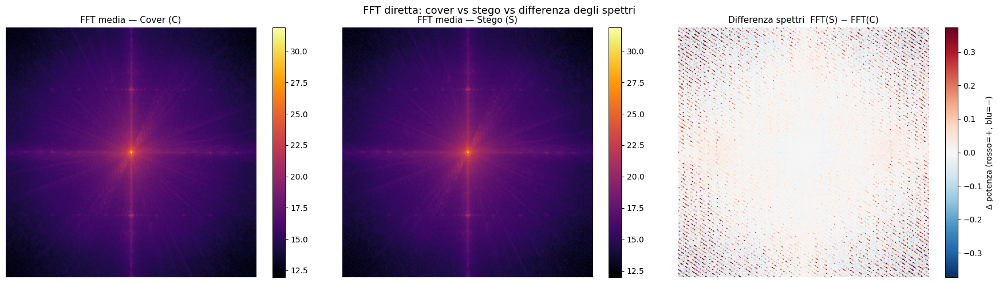

In [ ]:
# ============================================================
# CELLA 12 — FFT diretta su S e su C, confronto
# ============================================================

spettri_cover = []
spettri_stego = []

for path_cover, path_stego in tqdm(zip(paths_validi, paths_stego)):
    cover = np.array(Image.open(path_cover).convert("L"), dtype=np.float32)
    stego = np.array(Image.open(path_stego).convert("L"), dtype=np.float32)

    if cover.shape != stego.shape:
        continue

    h, w    = cover.shape
    window  = hann_window_2d(h, w)

    fft_c   = np.fft.fftshift(np.fft.fft2(cover * window))
    fft_s   = np.fft.fftshift(np.fft.fft2(stego * window))

    spettri_cover.append(np.abs(fft_c) ** 2)
    spettri_stego.append(np.abs(fft_s) ** 2)

spettro_cover_medio = np.log1p(np.mean(spettri_cover, axis=0))
spettro_stego_medio = np.log1p(np.mean(spettri_stego, axis=0))

# Differenza tra i due spettri medi
differenza_spettri  = spettro_stego_medio - spettro_cover_medio

fig, axes = plt.subplots(1, 3, figsize=(18, 5))
fig.suptitle("FFT diretta: cover vs stego vs differenza degli spettri", fontsize=13)

im0 = axes[0].imshow(spettro_cover_medio, cmap="inferno")
axes[0].set_title("FFT media — Cover (C)", fontsize=11)
axes[0].axis("off")
plt.colorbar(im0, ax=axes[0])

im1 = axes[1].imshow(spettro_stego_medio, cmap="inferno")
axes[1].set_title("FFT media — Stego (S)", fontsize=11)
axes[1].axis("off")
plt.colorbar(im1, ax=axes[1])

# La differenza è la cosa più importante:
# se le strisce compaiono qui, sono visibili senza conoscere C
im2 = axes[2].imshow(differenza_spettri, cmap="RdBu_r",
                      vmin=-np.percentile(np.abs(differenza_spettri), 99),
                      vmax= np.percentile(np.abs(differenza_spettri), 99))
axes[2].set_title("Differenza spettri  FFT(S) − FFT(C)", fontsize=11)
axes[2].axis("off")
plt.colorbar(im2, ax=axes[2], label="Δ potenza (rosso=+, blu=−)")

plt.tight_layout()
plt.savefig("fft_diretta_confronto.png", dpi=150, bbox_inches="tight")
plt.show()

Download immagini...


100%|██████████| 300/300 [00:00<00:00, 35347.24it/s]

Pronte: 300 immagini

Carico modello SteganoGAN Dense...


Encoding...


100%|██████████| 300/300 [00:00<00:00, 140168.34it/s]


Coppie valide: 300

Calcolo FFT su tutte le coppie...


300it [00:16, 18.38it/s]


Spettri calcolati: 300


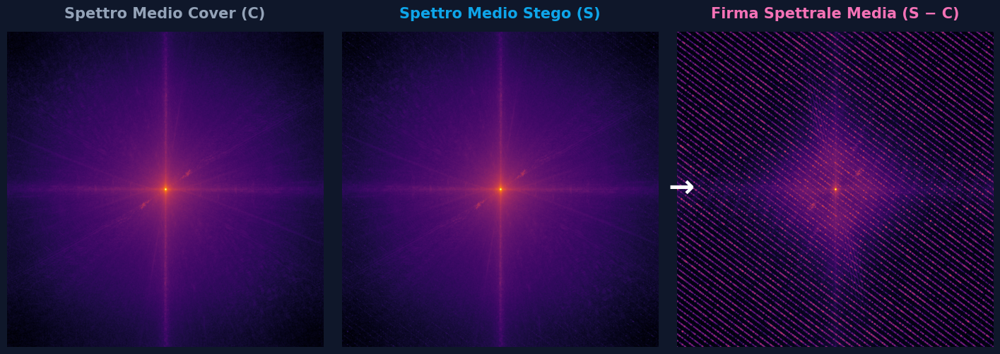


Salvato: firma_spettrale.png


In [ ]:
# ============================================================
# CODICE COMPLETO — firma spettrale su 300 immagini
# ============================================================
import os, time, requests
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from io import BytesIO
from tqdm import tqdm
from steganogan import SteganoGAN

# ── Config ────────────────────────────────────────────────
N_IMMAGINI = 300
IMG_SIZE   = 512
MESSAGGIO  = "steganogan spectral signature analysis"
DIR_COVER  = "cover_firma"
DIR_STEGO  = "stego_firma"
os.makedirs(DIR_COVER, exist_ok=True)
os.makedirs(DIR_STEGO, exist_ok=True)

# ── 1. Download 300 immagini ──────────────────────────────
print("Download immagini...")
paths_cover = []
for i in tqdm(range(N_IMMAGINI)):
    path = f"{DIR_COVER}/cover_{i:03d}.png"
    if not os.path.exists(path):
        try:
            r = requests.get(
                f"https://picsum.photos/seed/{i+500}/{IMG_SIZE}/{IMG_SIZE}",
                timeout=15)
            r.raise_for_status()
            Image.open(BytesIO(r.content)).convert("RGB").save(path)
            time.sleep(0.1)
        except Exception as e:
            print(f"  Errore {i}: {e}")
            continue
    paths_cover.append(path)
print(f"Pronte: {len(paths_cover)} immagini")

# ── 2. Carica modello e encoding ──────────────────────────
print("\nCarico modello SteganoGAN Dense...")
model = SteganoGAN.load(architecture='dense', verbose=False)

print("Encoding...")
paths_cover_ok = []
paths_stego_ok = []

for pc in tqdm(paths_cover):
    nome = os.path.basename(pc)
    ps   = f"{DIR_STEGO}/{nome.replace('cover', 'stego')}"
    if not os.path.exists(ps):
        try:
            model.encode(pc, ps, MESSAGGIO)
        except Exception as e:
            print(f"  Errore {nome}: {e}")
            continue
    paths_cover_ok.append(pc)
    paths_stego_ok.append(ps)

print(f"Coppie valide: {len(paths_cover_ok)}")

# ── 3. Calcolo FFT ────────────────────────────────────────
def hann2d(h, w):
    return np.outer(np.hanning(h), np.hanning(w))

print("\nCalcolo FFT su tutte le coppie...")
spettri_cover = []
spettri_stego = []
spettri_resid = []

for pc, ps in tqdm(zip(paths_cover_ok, paths_stego_ok)):
    orig  = np.array(Image.open(pc).convert("L"), dtype=np.float32)
    stego = np.array(Image.open(ps).convert("L"), dtype=np.float32)
    if orig.shape != stego.shape:
        continue

    h, w = orig.shape
    win  = hann2d(h, w)

    def spettro(img):
        return np.abs(np.fft.fftshift(np.fft.fft2(img * win))) ** 2

    spettri_cover.append(spettro(orig))
    spettri_stego.append(spettro(stego))
    spettri_resid.append(spettro(stego - orig))

print(f"Spettri calcolati: {len(spettri_resid)}")

# Media e scala logaritmica
sp_cover = np.log1p(np.mean(spettri_cover, axis=0))
sp_stego = np.log1p(np.mean(spettri_stego, axis=0))
sp_resid = np.log1p(np.mean(spettri_resid, axis=0))

# ── 4. Figura per la presentazione ───────────────────────
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
fig.patch.set_facecolor("#0F172A")

dati = [
    (sp_cover, "Spettro Medio Cover (C)",          "#94A3B8"), # Grigio
    (sp_stego, "Spettro Medio Stego (S)",          "#0EA5E9"), # Blu/Azzurro
    (sp_resid, "Firma Spettrale Media (S − C)",    "#F472B6"), # Rosa/Smeraldo
]

for ax, (sp, titolo, col) in zip(axes, dati):
    ax.imshow(sp, cmap="inferno", interpolation="lanczos")
    ax.set_title(titolo, color=col, fontsize=15,
                 fontweight="bold", pad=14)
    ax.axis("off")

# Freccia tra stego e residuo
fig.text(0.655, 0.5, "→", color="white",
         fontsize=32, ha="center", va="center", fontweight="bold")

plt.subplots_adjust(wspace=0.06)
plt.savefig("firma_spettrale.png", dpi=200,
            bbox_inches="tight", facecolor="#0F172A")
plt.show()
print("\nSalvato: firma_spettrale.png")

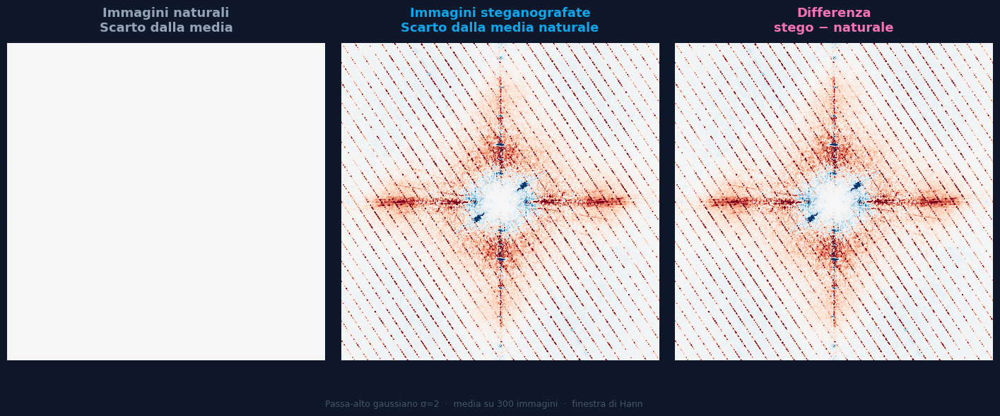

Salvato: wang_blind_risultato.png


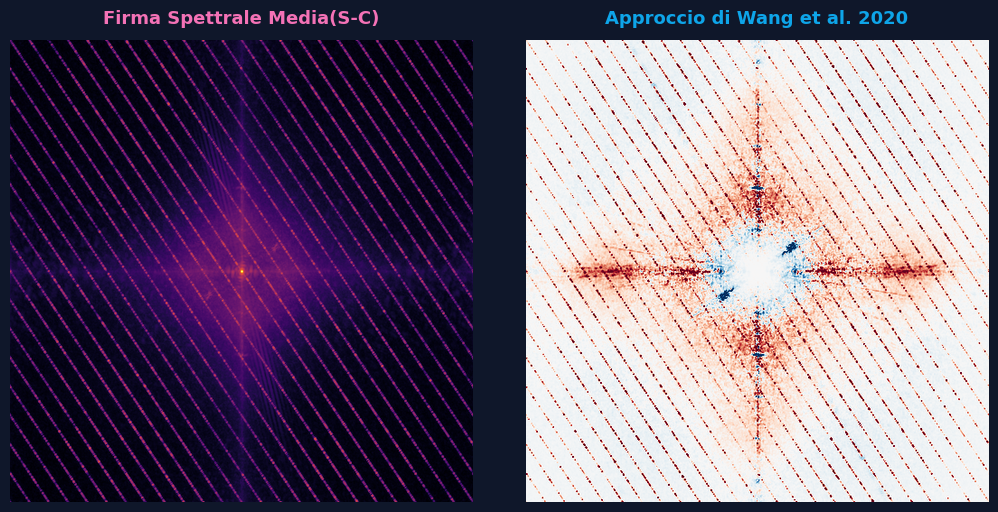

Salvato: confronto_blind_vs_reale.png


In [ ]:
# ============================================================
# SALVATAGGIO FIGURE PER PRESENTAZIONE
# ============================================================

# ── Figura 1: i tre scarti (il risultato principale) ─────
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
fig.patch.set_facecolor("#0F172A")

vmax = np.percentile(np.abs(scarto_medio_stego), 98)

dati = [
    (scarto_medio_cover,
     "RdBu_r",
     "Immagini naturali\nScarto dalla media",
     "#94A3B8",
     -vmax, vmax),
    (scarto_medio_stego,
     "RdBu_r",
     "Immagini steganografate\nScarto dalla media naturale",
     "#0EA5E9",
     -vmax, vmax),
    (scarto_medio_stego - scarto_medio_cover,
     "RdBu_r",
     "Differenza\nstego − naturale",
     "#F472B6",
     -np.percentile(np.abs(scarto_medio_stego - scarto_medio_cover), 98),
      np.percentile(np.abs(scarto_medio_stego - scarto_medio_cover), 98)),
]

for ax, (sp, cmap, titolo, col, vmin, vmax_) in zip(axes, dati):
    ax.imshow(sp, cmap=cmap, vmin=vmin, vmax=vmax_,
              interpolation="lanczos")
    ax.set_title(titolo, color=col, fontsize=13,
                 fontweight="bold", pad=12)
    ax.axis("off")

fig.text(0.5, 0.01,
         f"Passa-alto gaussiano σ=2  ·  media su {len(sp_pa_stego)} immagini  ·  finestra di Hann",
         color="#475569", fontsize=9, ha="center")

plt.subplots_adjust(wspace=0.05)
plt.savefig("wang_blind_risultato.png", dpi=200,
            bbox_inches="tight", facecolor="#0F172A")
plt.show()
print("Salvato: wang_blind_risultato.png")

# ── Figura 2: confronto residuo reale vs blind ───────────
fig2, axes2 = plt.subplots(1, 2, figsize=(13, 6))
fig2.patch.set_facecolor("#0F172A")

axes2[0].imshow(np.log1p(med_resid), cmap="inferno",
                interpolation="lanczos")
axes2[0].set_title("Firma Spettrale Media(S-C)",
                   color="#F472B6", fontsize=13,
                   fontweight="bold", pad=12)
axes2[0].axis("off")

axes2[1].imshow(scarto_medio_stego, cmap="RdBu_r",
                vmin=-vmax, vmax=vmax,
                interpolation="lanczos")
axes2[1].set_title("Approccio di Wang et al. 2020",
                   color="#0EA5E9", fontsize=13,
                   fontweight="bold", pad=12)
axes2[1].axis("off")

plt.subplots_adjust(wspace=0.05)
plt.savefig("confronto_blind_vs_reale.png", dpi=200,
            bbox_inches="tight", facecolor="#0F172A")
plt.show()
print("Salvato: confronto_blind_vs_reale.png")

Download immagini...


100%|██████████| 300/300 [02:15<00:00,  2.22it/s]


Pronte: 300

Carico modello...


100%|██████████| 300/300 [02:01<00:00,  2.46it/s]


Coppie: 300

Calcolo spettri...


300it [00:15, 18.76it/s]


Spettri calcolati: 300


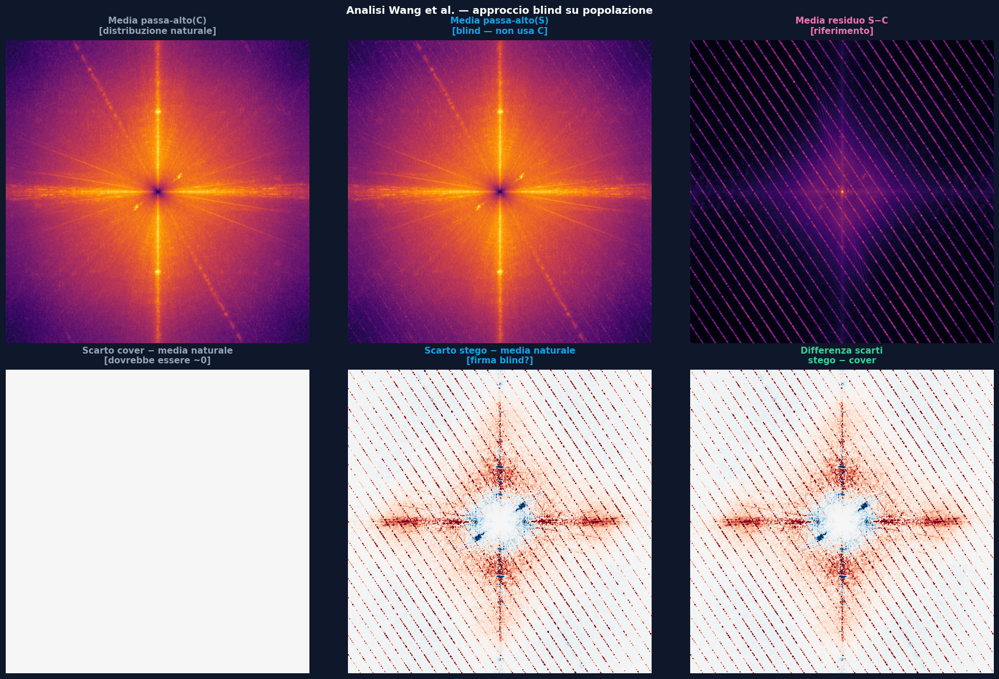


══ INTERPRETAZIONE ════════════════════════════

Plot 'Scarto cover − media naturale':
  → Deve essere piatto (~0). Se lo è, la baseline è corretta.

Plot 'Scarto stego − media naturale':
  → Se mostra strisce diagonali: firma rilevabile in modo BLIND
  → Se è piatto/rumoroso:        firma non rilevabile senza C

Plot 'Differenza scarti':
  → Isola cosa c'è in stego che non c'è nel naturale.
  → Strisce qui = firma sistematica sopra la baseline naturale.

Angolo picco scarto stego:  178°
Valore picco stego:         194125.7606
Valore max baseline cover:  0.0000
SNR (segnale/rumore):       708969141949488.62

→ FIRMA RILEVABILE in modo blind (SNR > 2)


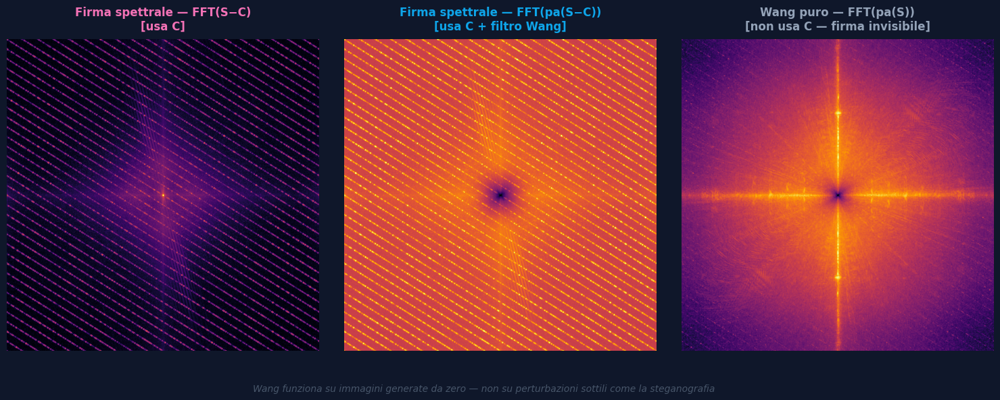

Salvato: firma_tre_confronti.png


In [6]:

import os, time, requests
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from io import BytesIO
from tqdm import tqdm
from scipy.ndimage import gaussian_filter
from steganogan import SteganoGAN

# ── Config ────────────────────────────────────────────────
N          = 300
IMG_SIZE   = 512
MESSAGGIO  = "steganogan wang analysis"
DIR_COVER  = "cover_wang"
DIR_STEGO  = "stego_wang"
os.makedirs(DIR_COVER, exist_ok=True)
os.makedirs(DIR_STEGO, exist_ok=True)

def hann2d(h, w):
    return np.outer(np.hanning(h), np.hanning(w))

def passa_alto(img_gray, sigma=2):
    img_f = img_gray.astype(np.float32)
    return img_f - gaussian_filter(img_f, sigma=sigma)

def calcola_fft(img_2d):
    h, w = img_2d.shape
    return np.abs(np.fft.fftshift(
           np.fft.fft2(img_2d * hann2d(h, w)))) ** 2

# ── 1. Download ───────────────────────────────────────────
print("Download immagini...")
paths_cover = []
for i in tqdm(range(N)):
    path = f"{DIR_COVER}/cover_{i:03d}.png"
    if not os.path.exists(path):
        try:
            r = requests.get(
                f"https://picsum.photos/seed/{i+800}/{IMG_SIZE}/{IMG_SIZE}",
                timeout=15)
            Image.open(BytesIO(r.content)).convert("RGB").save(path)
            time.sleep(0.1)
        except Exception as e:
            print(f"  Errore {i}: {e}"); continue
    paths_cover.append(path)
print(f"Pronte: {len(paths_cover)}")

# ── 2. Encoding ───────────────────────────────────────────
print("\nCarico modello...")
model = SteganoGAN.load(architecture='dense', verbose=False)

paths_cover_ok, paths_stego_ok = [], []
for pc in tqdm(paths_cover):
    nome = os.path.basename(pc)
    ps   = f"{DIR_STEGO}/{nome.replace('cover','stego')}"
    if not os.path.exists(ps):
        try: model.encode(pc, ps, MESSAGGIO)
        except Exception as e:
            print(f"  Errore {nome}: {e}"); continue
    paths_cover_ok.append(pc)
    paths_stego_ok.append(ps)
print(f"Coppie: {len(paths_cover_ok)}")

# ── 3. Calcolo spettri ────────────────────────────────────
print("\nCalcolo spettri...")

# Tre tipi di spettro
sp_pa_cover = []   # passa-alto(C) — naturale
sp_pa_stego = []   # passa-alto(S) — blind (non usa C)
sp_resid    = []   # S-C           — riferimento

for pc, ps in tqdm(zip(paths_cover_ok, paths_stego_ok)):
    orig  = np.array(Image.open(pc).convert("L"), dtype=np.float32)
    stego = np.array(Image.open(ps).convert("L"), dtype=np.float32)
    if orig.shape != stego.shape: continue

    sp_pa_cover.append(calcola_fft(passa_alto(orig)))
    sp_pa_stego.append(calcola_fft(passa_alto(stego)))
    sp_resid.append(calcola_fft(stego - orig))

sp_pa_cover = np.array(sp_pa_cover)
sp_pa_stego = np.array(sp_pa_stego)
sp_resid    = np.array(sp_resid)

# Spettri medi
med_cover = np.mean(sp_pa_cover, axis=0)
med_stego = np.mean(sp_pa_stego, axis=0)
med_resid = np.mean(sp_resid,    axis=0)

print(f"Spettri calcolati: {len(sp_resid)}")

# ── 4. Approccio Wang CORRETTO — blind su popolazione ─────
# Domanda: pass-alto(S) si discosta dalla distribuzione
# naturale (media di tutti i pass-alto(C))?
# Non usiamo la C specifica — usiamo la media delle naturali

media_naturale = med_cover   # distribuzione media immagini naturali

# Differenza per ogni immagine stego rispetto alla media naturale
scarti_stego  = sp_pa_stego - media_naturale   # (N, H, W)
scarti_cover  = sp_pa_cover - media_naturale   # (N, H, W) — baseline

# Scarto medio
scarto_medio_stego = np.mean(scarti_stego, axis=0)
scarto_medio_cover = np.mean(scarti_cover, axis=0)   # dovrebbe essere ~0

# ── 5. Visualizzazione ────────────────────────────────────
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
fig.patch.set_facecolor("#0F172A")
fig.suptitle(
    "Analisi Wang et al. — approccio blind su popolazione",
    color="white", fontsize=13, fontweight="bold")

# Riga 1: spettri medi
dati_r1 = [
    (np.log1p(med_cover), "inferno",
     "Media passa-alto(C)\n[distribuzione naturale]", "#94A3B8", None, None),
    (np.log1p(med_stego), "inferno",
     "Media passa-alto(S)\n[blind — non usa C]",      "#0EA5E9", None, None),
    (np.log1p(med_resid), "inferno",
     "Media residuo S−C\n[riferimento]",               "#F472B6", None, None),
]
for ax, (sp, cmap, titolo, col, vmin, vmax) in zip(axes[0], dati_r1):
    ax.imshow(sp, cmap=cmap, interpolation="lanczos")
    ax.set_title(titolo, color=col, fontsize=11, fontweight="bold", pad=8)
    ax.axis("off")

# Riga 2: scarti dalla distribuzione naturale
vmax_s = np.percentile(np.abs(scarto_medio_stego), 98)
vmax_c = np.percentile(np.abs(scarto_medio_cover), 98)
vmax   = max(vmax_s, vmax_c)

dati_r2 = [
    (scarto_medio_cover, "RdBu_r",
     "Scarto cover − media naturale\n[dovrebbe essere ~0]",
     "#94A3B8", -vmax, vmax),
    (scarto_medio_stego, "RdBu_r",
     "Scarto stego − media naturale\n[firma blind?]",
     "#0EA5E9", -vmax, vmax),
    (scarto_medio_stego - scarto_medio_cover, "RdBu_r",
     "Differenza scarti\nstego − cover",
     "#34D399",
     -np.percentile(np.abs(scarto_medio_stego - scarto_medio_cover), 98),
      np.percentile(np.abs(scarto_medio_stego - scarto_medio_cover), 98)),
]
for ax, (sp, cmap, titolo, col, vmin, vmax_) in zip(axes[1], dati_r2):
    ax.imshow(sp, cmap=cmap, vmin=vmin, vmax=vmax_,
              interpolation="lanczos")
    ax.set_title(titolo, color=col, fontsize=11, fontweight="bold", pad=8)
    ax.axis("off")

plt.tight_layout()
plt.savefig("wang_blind_popolazione.png", dpi=150,
            bbox_inches="tight", facecolor="#0F172A")
plt.show()

# ── 6. Verdetto ───────────────────────────────────────────
# Il plot chiave è "Scarto stego − media naturale":
# se mostra le strisce diagonali → rilevabile in modo blind
# se è piatto/rumoroso          → non rilevabile

print("\n══ INTERPRETAZIONE ════════════════════════════")
print()
print("Plot 'Scarto cover − media naturale':")
print("  → Deve essere piatto (~0). Se lo è, la baseline è corretta.")
print()
print("Plot 'Scarto stego − media naturale':")
print("  → Se mostra strisce diagonali: firma rilevabile in modo BLIND")
print("  → Se è piatto/rumoroso:        firma non rilevabile senza C")
print()
print("Plot 'Differenza scarti':")
print("  → Isola cosa c'è in stego che non c'è nel naturale.")
print("  → Strisce qui = firma sistematica sopra la baseline naturale.")

# Misura numerica
h, w   = med_stego.shape
cy, cx = h//2, w//2
y, x   = np.ogrid[:h, :w]
dy, dx = y-cy, x-cx
raggio = np.sqrt(dx**2+dy**2)
BANDA  = max(h,w)//25

angoli = np.arange(0, 180, 1)
en_scarto_stego = []
en_scarto_cover = []

for ang_deg in angoli:
    ang  = np.deg2rad(ang_deg)
    dist = np.abs(dy*np.cos(ang) - dx*np.sin(ang))
    mask = (dist <= BANDA) & (raggio > 20)
    en_scarto_stego.append(scarto_medio_stego[mask].mean())
    en_scarto_cover.append(scarto_medio_cover[mask].mean())

en_scarto_stego = np.array(en_scarto_stego)
en_scarto_cover = np.array(en_scarto_cover)

ang_picco = angoli[np.argmax(en_scarto_stego)]
val_picco = en_scarto_stego.max()
val_cover = np.abs(en_scarto_cover).max()
snr       = val_picco / (val_cover + 1e-10)

print(f"\nAngolo picco scarto stego:  {ang_picco}°")
print(f"Valore picco stego:         {val_picco:.4f}")
print(f"Valore max baseline cover:  {val_cover:.4f}")
print(f"SNR (segnale/rumore):       {snr:.2f}")
print()
if snr > 2.0:
    print("→ FIRMA RILEVABILE in modo blind (SNR > 2)")
elif snr > 1.3:
    print("→ FIRMA DEBOLE ma presente (SNR > 1.3)")
else:
    print("→ FIRMA NON RILEVABILE in modo blind (SNR ≤ 1.3)")

# ── AGGIUNTA: vero metodo Wang su S senza C ──────────────
residui_wang_puro = []

for ps in ok_s:
    s = np.array(Image.open(ps).convert("L"), dtype=np.float32)
    residui_wang_puro.append(passa_alto(s))   # solo S, nessuna sottrazione

firma_wang_puro = fft_media(residui_wang_puro)

# ── Nuovo plot a tre colonne ──────────────────────────────
fig2, axes2 = plt.subplots(1, 3, figsize=(19, 6))
fig2.patch.set_facecolor("#0F172A")

axes2[0].imshow(firma_classica, cmap="inferno", interpolation="lanczos")
axes2[0].set_title("Firma spettrale — FFT(S−C)\n[usa C]",
                   color="#F472B6", fontsize=12, fontweight="bold", pad=10)
axes2[0].axis("off")

axes2[1].imshow(firma_wang, cmap="inferno", interpolation="lanczos")
axes2[1].set_title("Firma spettrale — FFT(pa(S−C))\n[usa C + filtro Wang]",
                   color="#0EA5E9", fontsize=12, fontweight="bold", pad=10)
axes2[1].axis("off")

axes2[2].imshow(firma_wang_puro, cmap="inferno", interpolation="lanczos")
axes2[2].set_title("Wang puro — FFT(pa(S))\n[non usa C — firma invisibile]",
                   color="#94A3B8", fontsize=12, fontweight="bold", pad=10)
axes2[2].axis("off")

fig2.text(0.5, 0.01,
          "Wang funziona su immagini generate da zero — "
          "non su perturbazioni sottili come la steganografia",
          color="#475569", fontsize=10, ha="center", style="italic")

plt.subplots_adjust(wspace=0.05)
plt.savefig("firma_tre_confronti.png", dpi=200,
            bbox_inches="tight", facecolor="#0F172A")
plt.show()
print("Salvato: firma_tre_confronti.png")